## xG model

This notebook demonstrates the key steps of our xG project. <br>
For detailed descriptions and methodology, please refer to the <a href='README.md'>README</a>.

In [1]:
from pyspark.sql import SparkSession
import pyspark.sql.functions as F

from modules.xG_constants import *
from modules.xG_preprocessing import Preprocessing
from modules.xG_visualization import Visualization
from modules.xG_models import ModelTrainer
from modules.xG_evaluation import ModelEvaluation

In [4]:
# Initialize SparkSession
spark = SparkSession.builder.appName("xG_10").getOrCreate()

In [3]:
PL = spark.read.csv('Dataset/events/England - Premier League.csv', inferSchema=True, header=True, sep=';')
L1 = spark.read.csv('Dataset/events/France - Ligue 1.csv', inferSchema=True, header=True, sep=';')
B1 = spark.read.csv('Dataset/events/Germany - 1. Bundesliga.csv', inferSchema=True, header=True, sep=';')
SA = spark.read.csv('Dataset/events/Italy - Serie A.csv', inferSchema=True, header=True, sep=';')
LL = spark.read.csv('Dataset/events/Spain - La Liga.csv', inferSchema=True, header=True, sep=';')

### Preprocessing

In [5]:
PL = Preprocessing(spark, PL)
L1 = Preprocessing(spark, L1)
B1 = Preprocessing(spark, B1)
SA = Preprocessing(spark, SA)
LL = Preprocessing(spark, LL)

25/03/01 00:30:05 WARN GarbageCollectionMetrics: To enable non-built-in garbage collector(s) List(G1 Concurrent GC), users should configure it(them) to spark.eventLog.gcMetrics.youngGenerationGarbageCollectors or spark.eventLog.gcMetrics.oldGenerationGarbageCollectors
25/03/01 00:30:10 WARN SparkStringUtils: Truncated the string representation of a plan since it was too large. This behavior can be adjusted by setting 'spark.sql.debug.maxToStringFields'.


In [6]:
print(f'We have {PL.df.count()} shots in the premier league for the {SEASON} season.')
print(f'We have {L1.df.count()} shots in the Ligue 1 for the {SEASON} season.')
print(f'We have {B1.df.count()} shots in the Bundesliga for the {SEASON} season.')
print(f'We have {SA.df.count()} shots in the Serie A for the {SEASON} season.')
print(f'We have {LL.df.count()} shots in the La Liga for the {SEASON} season.')

We have 9908 shots in the premier league for the 2015/2016 season.
We have 8814 shots in the Ligue 1 for the 2015/2016 season.
We have 7831 shots in the Bundesliga for the 2015/2016 season.
We have 9998 shots in the Serie A for the 2015/2016 season.
We have 9168 shots in the La Liga for the 2015/2016 season.


### Preprocessed dataset

In [7]:
PL.df.show(n = 5, truncate=False)

+------------------------------------+--------------------+---------+--------+-----------------+------+------+------+---------------+---------------+----------------+----------+-------------------+-------+-------+-------+-----------+------------+-------+-----------+-------+------+-----------+-------+-------+---------------------+----------------+-------------+------------------+------------------+------------------+--------------+---------------+---------------+---------------+--------------+--------------------+-------------------+--------+-----------+-----------+-----------+---------------+----------+-------------+-----------+-----------------+---------------+----------------+-------------+-------------+------------+------------------+----------+----------+-------------+-----------------+----+
|id                                  |player              |player_id|match_id|team             |period|minute|second|shot_location_x|shot_location_y|distance_to_goal|shot_angle|preferred_foot_s

In [8]:
L1.df.show(n = 5, truncate=False)

+------------------------------------+------------------------------+---------+--------+-------------------+------+------+------+---------------+---------------+----------------+----------+-------------------+-------+-------+-------+-----------+------------+-------+-----------+-------+------+-----------+-------+-------+---------------------+----------------+-------------+------------------+------------------+------------------+--------------+---------------+---------------+---------------+--------------+--------------------+-------------------+--------+-----------+-----------+----------+---------------+----------+-------------+-----------+-----------------+---------------+----------------+-------------+-------------+------------+------------------+----------+----------+-------------+-----------------+----+
|id                                  |player                        |player_id|match_id|team               |period|minute|second|shot_location_x|shot_location_y|distance_to_goal|shot

In [9]:
B1.df.show(n = 5, truncate=False)

+------------------------------------+-----------------------------+---------+--------+-------------+------+------+------+---------------+---------------+----------------+----------+-------------------+-------+-------+-------+-----------+------------+-------+-----------+-------+------+-----------+-------+-------+---------------------+----------------+-------------+------------------+------------------+------------------+--------------+---------------+---------------+---------------+--------------+--------------------+-------------------+--------+-----------+-----------+-----------+---------------+----------+-------------+-----------+-----------------+---------------+----------------+-------------+-------------+------------+------------------+----------+----------+-------------+-----------------+----+
|id                                  |player                       |player_id|match_id|team         |period|minute|second|shot_location_x|shot_location_y|distance_to_goal|shot_angle|prefer

In [10]:
SA.df.show(n = 5, truncate=False)

+------------------------------------+-----------------------------+---------+--------+-------+------+------+------+---------------+---------------+----------------+----------+-------------------+-------+-------+-------+-----------+------------+-------+-----------+-------+------+-----------+-------+-------+---------------------+----------------+-------------+------------------+------------------+------------------+--------------+---------------+---------------+---------------+--------------+--------------------+-------------------+--------+-----------+-----------+----------+---------------+----------+-------------+-----------+-----------------+---------------+----------------+-------------+-------------+------------+------------------+----------+----------+-------------+-----------------+----+
|id                                  |player                       |player_id|match_id|team   |period|minute|second|shot_location_x|shot_location_y|distance_to_goal|shot_angle|preferred_foot_shot

In [11]:
LL.df.show(n = 5, truncate=False)

+------------------------------------+-----------------------------+---------+--------+----------------------+------+------+------+---------------+---------------+----------------+----------+-------------------+-------+-------+-------+-----------+------------+-------+-----------+-------+------+-----------+-------+-------+---------------------+----------------+-------------+------------------+------------------+------------------+--------------+---------------+---------------+---------------+--------------+--------------------+-------------------+--------+-----------+-----------+----------+---------------+----------+-------------+-----------+-----------------+---------------+----------------+-------------+-------------+------------+------------------+----------+----------+-------------+-----------------+----+
|id                                  |player                       |player_id|match_id|team                  |period|minute|second|shot_location_x|shot_location_y|distance_to_goal|

### Exploratory Data Analysis

In [ ]:
PL_viz = Visualization(PL)
L1_viz = Visualization(L1)
B1_viz = Visualization(B1)
SA_viz = Visualization(SA)
LL_viz = Visualization(LL)

#### Correlation matrix

Premier League correlation matrix


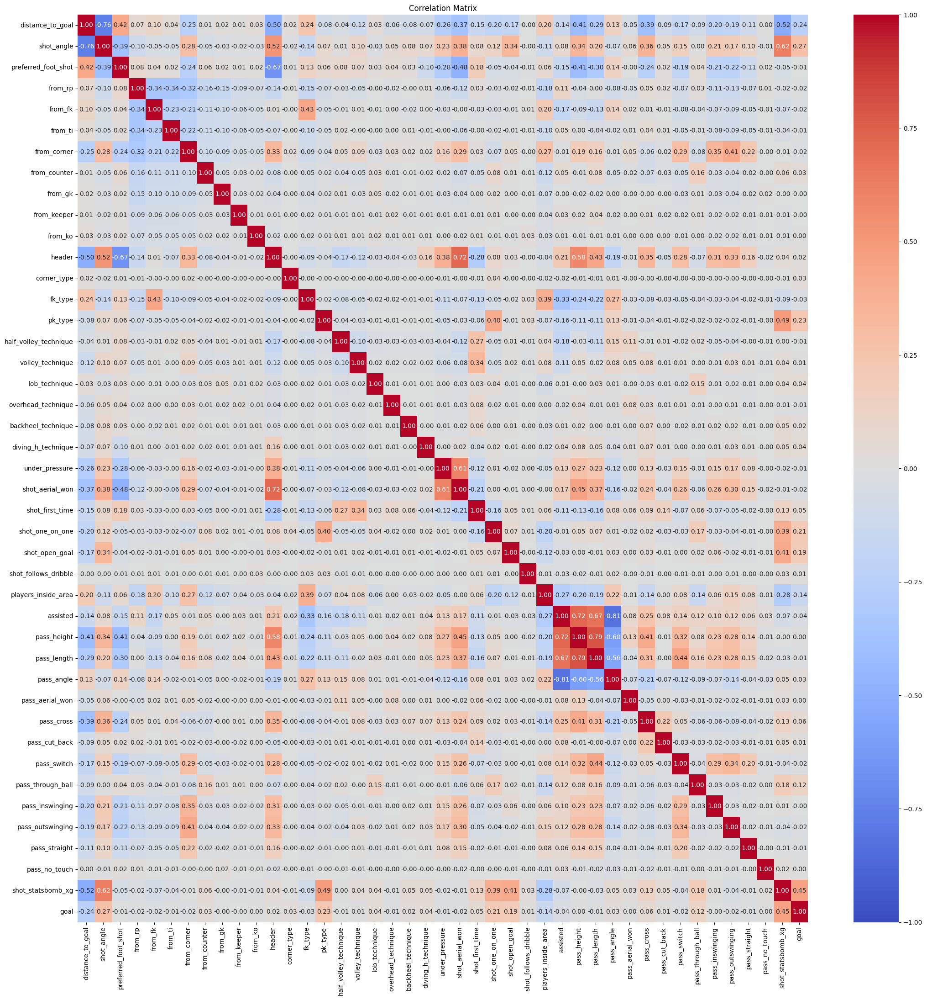

Ligue 1 correlation matrix


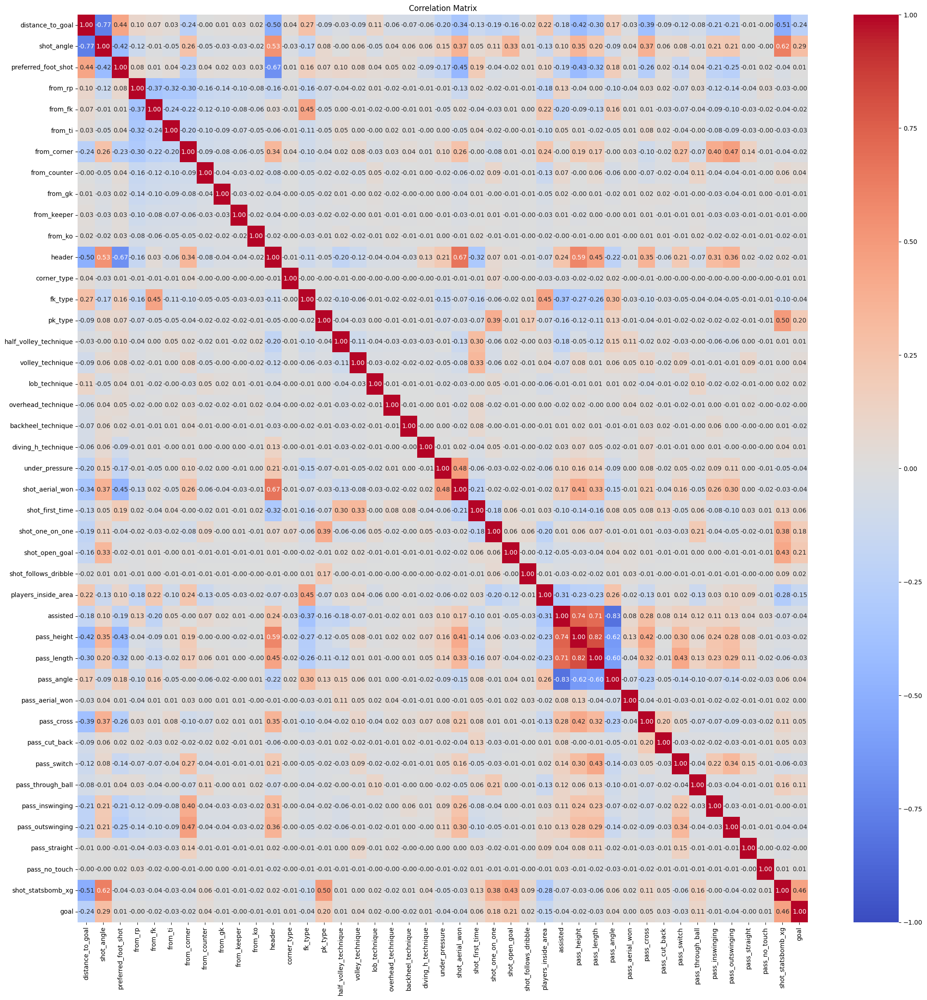

Bundesliga correlation matrix


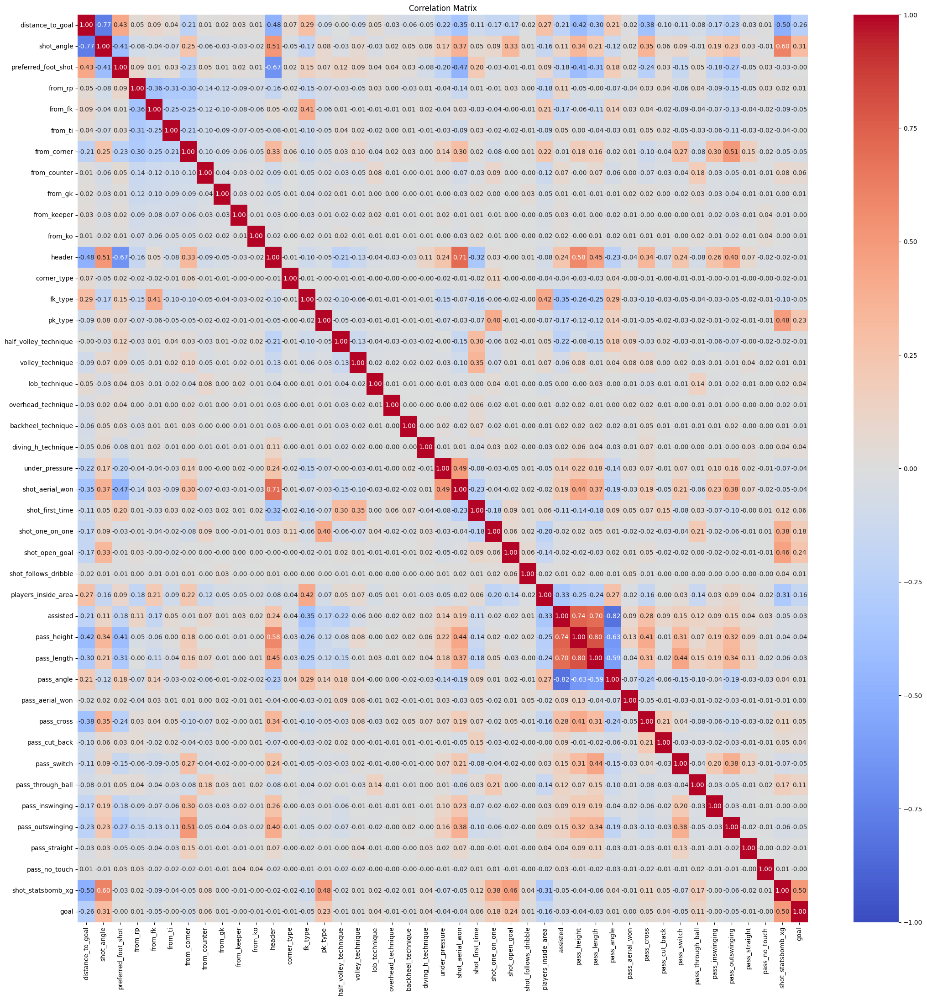

Serie A correlation matrix


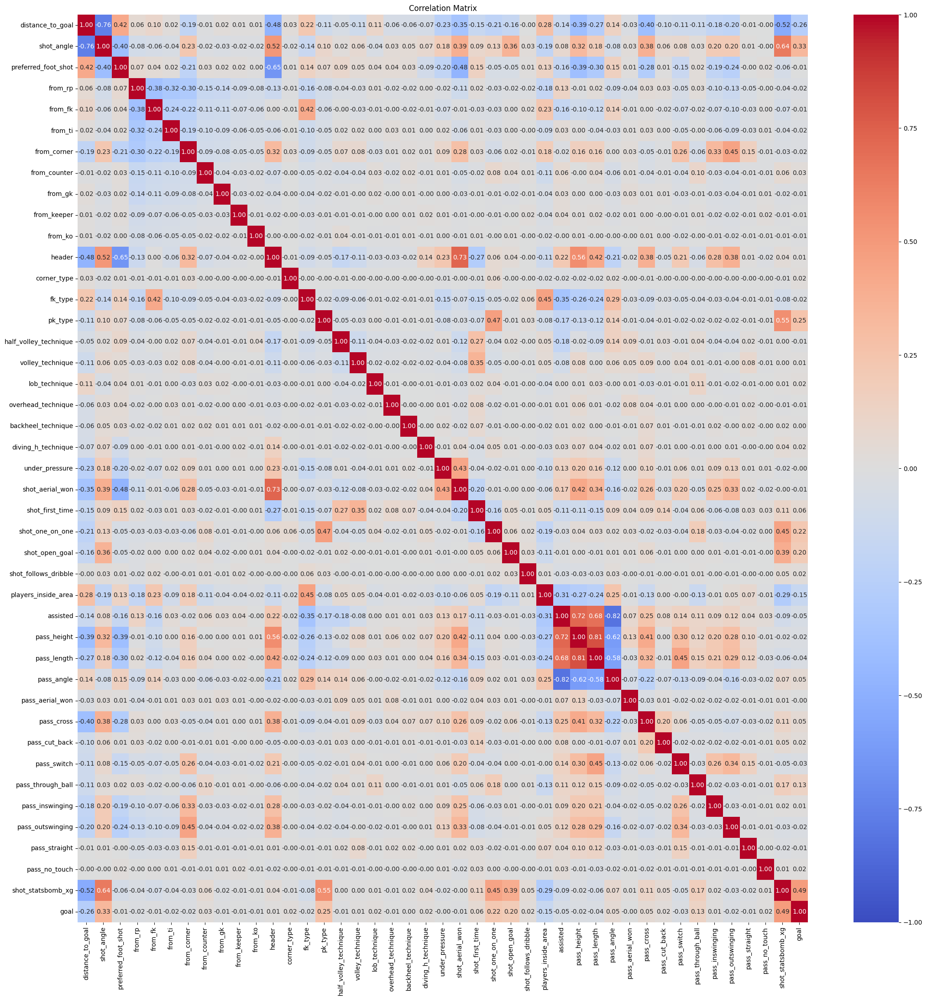

La Liga League correlation matrix


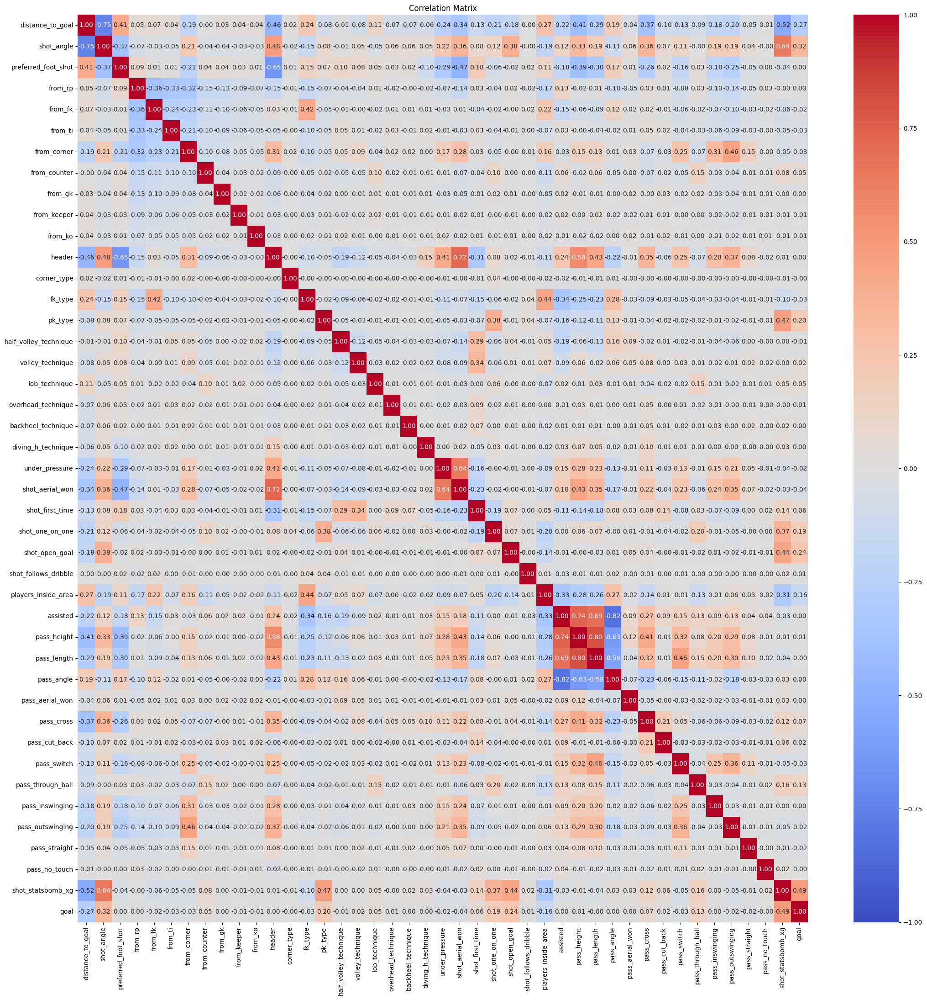

In [13]:
print('Premier League correlation matrix')
PL_viz.correlation()
print('Ligue 1 correlation matrix')
L1_viz.correlation()
print('Bundesliga correlation matrix')
B1_viz.correlation()
print('Serie A correlation matrix')
SA_viz.correlation()
print('La Liga League correlation matrix')
LL_viz.correlation()

Interpreting the 5 correlation matrices reveals that the correlations among key variables are similar across all leagues.<br>
This consistency suggests that the underlying relationships between shot metrics and other features are robust, regardless of league-specific differences, and reinforces the generalizability of our feature selection for modeling xG.

Furthermore, the variables ```assisted```, ```pass_height```, ```pass_length```, and ```pass_angle``` exhibit strong inter-correlations.<br>
This is largely due to the encoding strategy: ```assisted``` indicates the presence of a pass leading to a shot, and when its value is 0, the other variables are assigned predefined values that fall outside the normal range observed when a pass is involved.<br>
Consequently, these variables tend to move together, resulting in the observed strong correlations.

#### Shot and Goal heatmap

In [18]:
def describe_league(df):
    shots = df.count()
    goals = df.filter(F.col('goal')==1).count()
    pens = df.filter(F.col('pk_type')==1).count()
    pens_s = df.filter((F.col('pk_type')==1) & (F.col('goal')==1)).count()
    print(f'Shots : {shots}')
    print(f'Goals : {goals}')
    print(f'Goal % : {(goals / shots) * 100 :.2f} %')
    print(f'Penalties : {pens}')
    print(f'Penalties Scored : {pens_s}')
    print(f'Penalties Scored % : {(pens_s / pens) * 100 :.2f} %')

Shot and Goal heatmap for Premier League in 2015/2016 season.
Shots : 9908
Goals : 988
Goal % : 9.97 %
Penalties : 91
Penalties Scored : 74
Penalties Scored % : 81.32 %


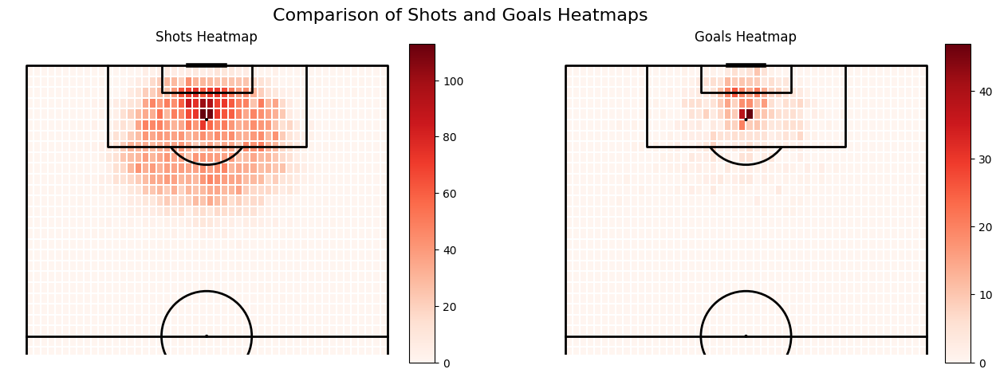

Shot and Goal heatmap for Ligue 1 in 2015/2016 season.
Shots : 8814
Goals : 916
Goal % : 10.39 %
Penalties : 91
Penalties Scored : 64
Penalties Scored % : 70.33 %


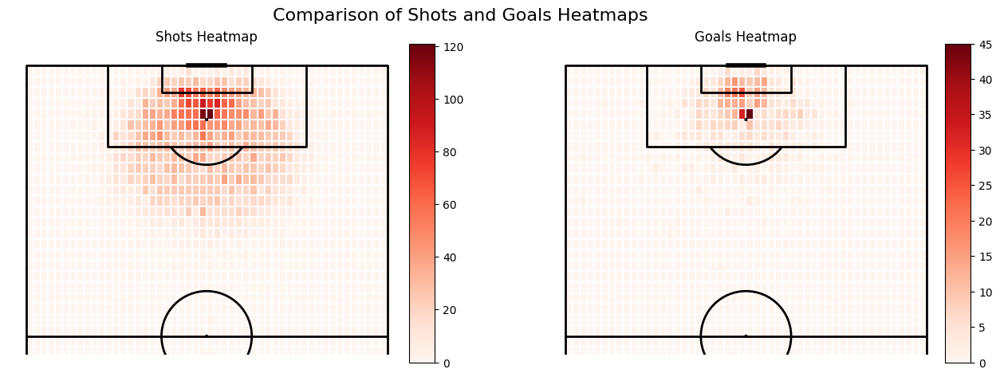

Shot and Goal heatmap for Bundesliga in 2015/2016 season.
Shots : 7831
Goals : 837
Goal % : 10.69 %
Penalties : 86
Penalties Scored : 68
Penalties Scored % : 79.07 %


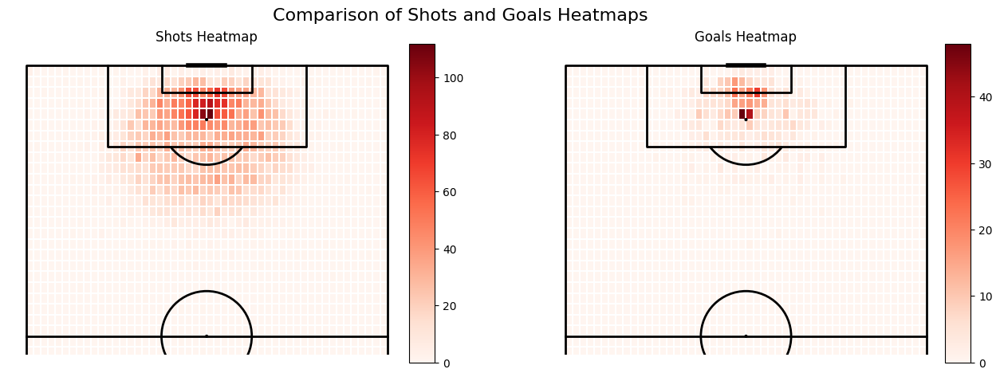

Shot and Goal heatmap for Serie A in 2015/2016 season.
Shots : 9998
Goals : 951
Goal % : 9.51 %
Penalties : 121
Penalties Scored : 93
Penalties Scored % : 76.86 %


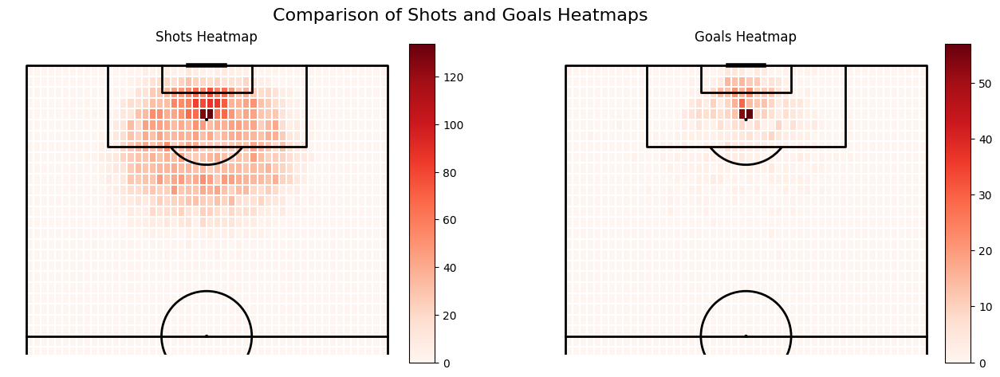

Shot and Goal heatmap for La Liga League in 2015/2016 season.
Shots : 9168
Goals : 1014
Goal % : 11.06 %
Penalties : 97
Penalties Scored : 69
Penalties Scored % : 71.13 %


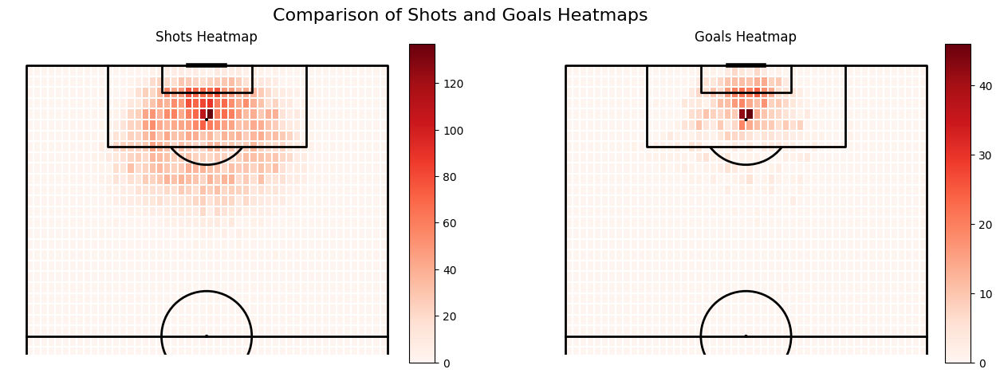

In [ ]:
print(f'Shot and Goal heatmap for Premier League in {SEASON} season.')
describe_league(PL.df)
PL_viz.shot_goal_heatmap()

print(f'Shot and Goal heatmap for Ligue 1 in {SEASON} season.')
describe_league(L1.df)
L1_viz.shot_goal_heatmap()

print(f'Shot and Goal heatmap for Bundesliga in {SEASON} season.')
describe_league(B1.df)
B1_viz.shot_goal_heatmap()

print(f'Shot and Goal heatmap for Serie A in {SEASON} season.')
describe_league(SA.df)
SA_viz.shot_goal_heatmap()

print(f'Shot and Goal heatmap for La Liga League in {SEASON} season.')
describe_league(LL.df)
LL_viz.shot_goal_heatmap()

A comparison of the shot and goal heatmaps across Europe’s top five leagues (2015/2016) reveals both similarities and subtle differences.<br>
The ```Premier League``` recorded 9,908 shots with a 9.97% conversion rate, while ```La Liga```’s 9,168 shots yielded the highest conversion rate at 11.06%.<br>
```Serie A``` led in total shots (9,998) yet had a lower conversion rate (9.51%), and the ```Bundesliga```, despite the fewest shots (7,831), maintained a strong 10.69% conversion rate.

Penalty statistics also vary considerably: ```Serie A``` had 121 penalties with a 76.86% success rate, whereas the ```Bundesliga``` saw only 86 penalties but at a higher 79.07% success rate. ```La Liga``` and ```Ligue 1``` had the lowest penalty success rate with 71.13% and 70.33% respectively.<br>
Despite these league-specific figures, the heatmaps consistently show that shots and goals are concentrated in high-probability areas near the goal, highlighting a broadly similar spatial tendency for scoring opportunities across these major competitions.

#### xG and Goal Distribution

Distribution of xG in Premier League for the 2015/2016 season.


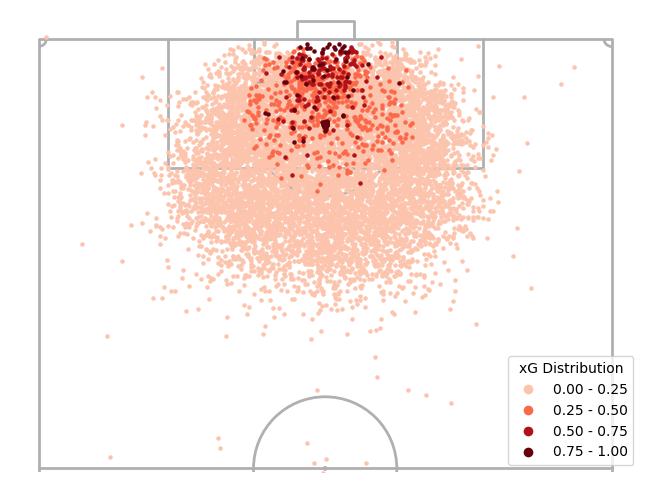

Distribution of xG in Ligue 1 for the 2015/2016 season.


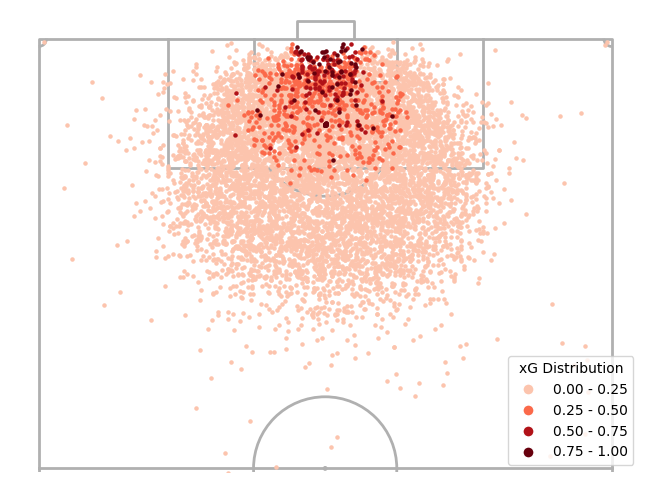

Distribution of xG in Bundesliga for the 2015/2016 season.


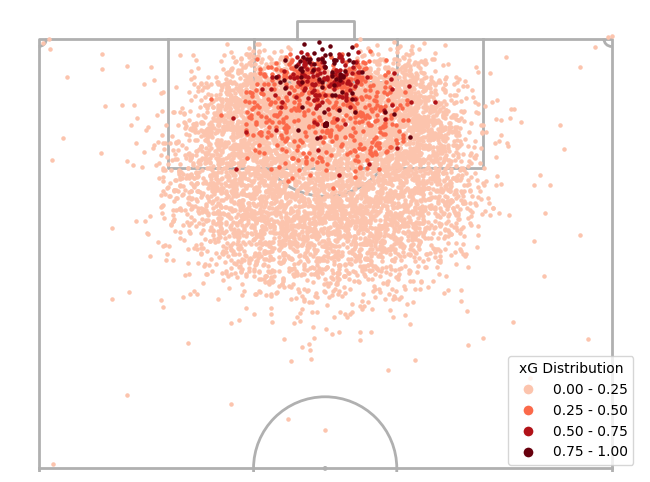

Distribution of xG in Serie A for the 2015/2016 season.


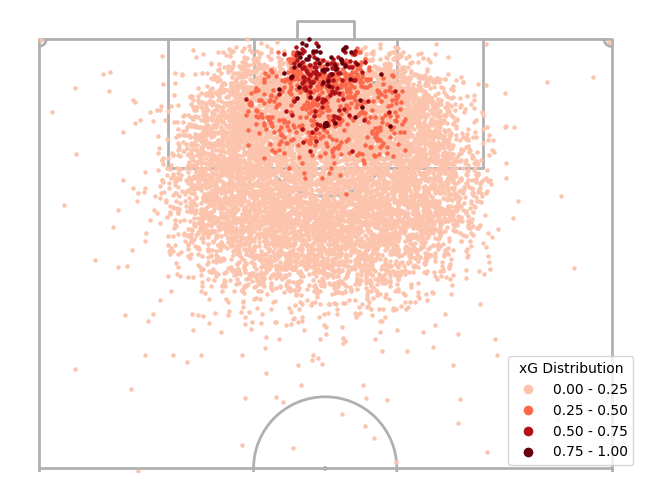

Distribution of xG in La Liga for the 2015/2016 season.


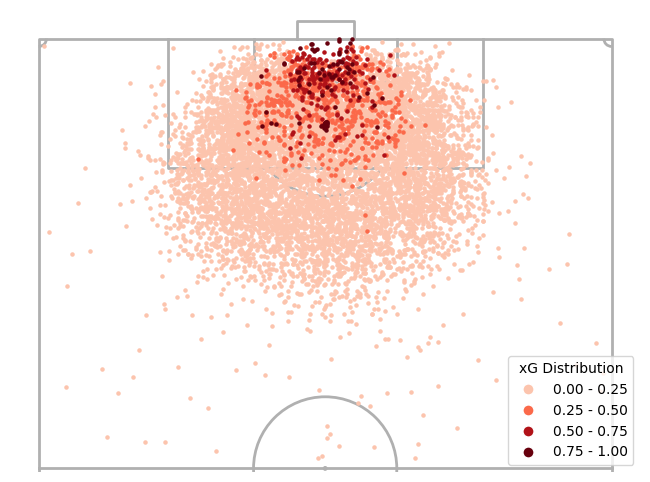

In [26]:
print(f'Distribution of xG in Premier League for the {SEASON} season.')
PL_viz.shot_distribution()
print(f'Distribution of xG in Ligue 1 for the {SEASON} season.')
L1_viz.shot_distribution()
print(f'Distribution of xG in Bundesliga for the {SEASON} season.')
B1_viz.shot_distribution()
print(f'Distribution of xG in Serie A for the {SEASON} season.')
SA_viz.shot_distribution()
print(f'Distribution of xG in La Liga for the {SEASON} season.')
LL_viz.shot_distribution()

All xG distribution plots share a similar pattern:

- xG > 0.75: These shots are exclusively located inside the 18-yard box across all five leagues, which is expected.
- xG > 0.50: Such shots rarely appear on the edge of the box or outside it. We see only about five points in both the Bundesliga and Premier League, likely explained by open-goal situations.
- 0.25 ≤ xG ≤ 0.50: These shots are still mostly within the box but are more widely dispersed compared to higher xG values.
- xG < 0.25: This is the most common category, spread across the field, though primarily focused in central areas further from goal.

The fundamental takeaway remains consistent: regardless of the league, the highest xG opportunities occur in and around the six-yard box, underscoring how proximity and shooting angle strongly influence the likelihood of scoring.

In [43]:
B1.df.filter((F.col('shot_statsbomb_xg')>0.5) & (F.col('shot_location_x')<103)).show(truncate=False)
PL.df.filter((F.col('shot_statsbomb_xg')>0.5) & (F.col('shot_location_x')<103)).show(truncate=False)

+------------------------------------+-----------------------------+---------+--------+-------------+------+------+------+---------------+---------------+----------------+----------+-------------------+-------+-------+-------+-----------+------------+-------+-----------+-------+------+-----------+-------+-------+---------------------+----------------+-------------+------------------+------------------+------------------+--------------+---------------+---------------+---------------+--------------+--------------------+-------------------+--------+-----------+-----------+-----------+---------------+----------+-------------+-----------+-----------------+---------------+----------------+-------------+-------------+------------+------------------+----------+----------+-------------+-----------------+----+
|id                                  |player                       |player_id|match_id|team         |period|minute|second|shot_location_x|shot_location_y|distance_to_goal|shot_angle|prefer

Bundesliga high xG shots outside area:


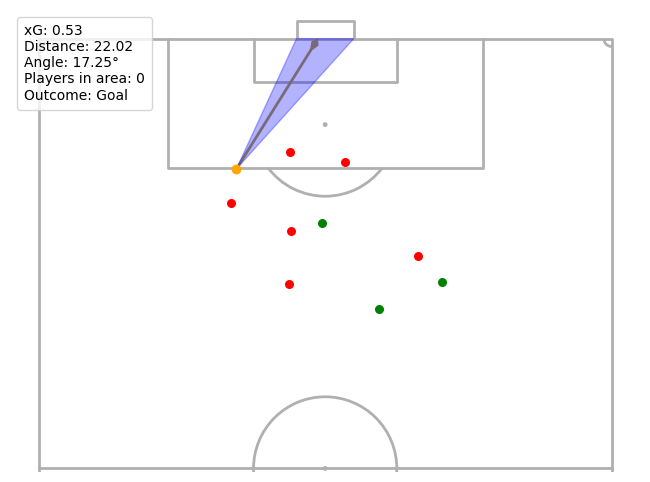

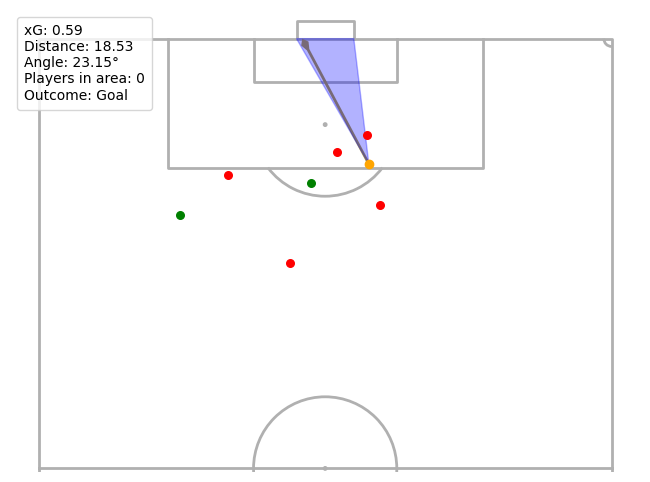

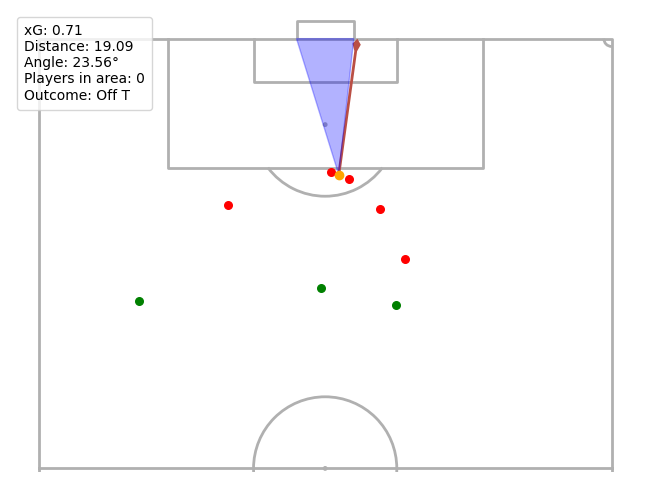

Premier League high xG shots outside area:


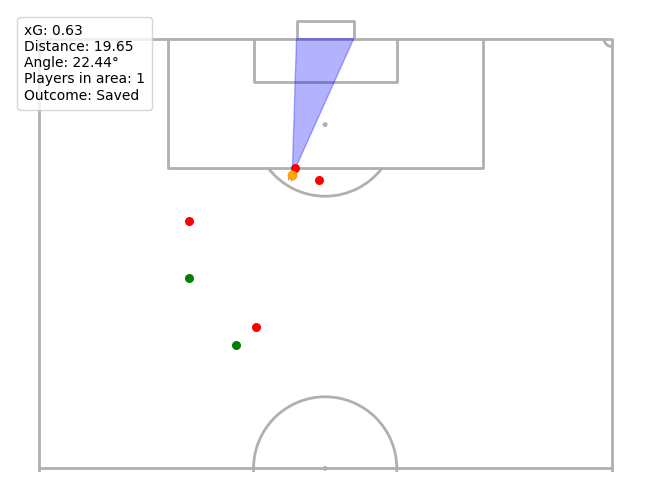

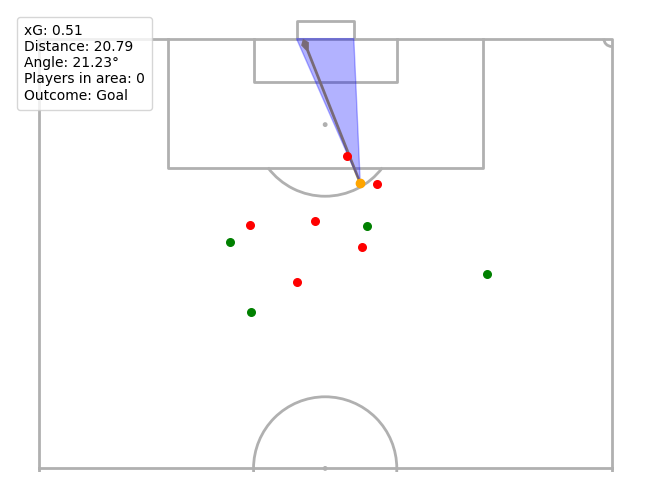

In [45]:
print('Bundesliga high xG shots outside area:')
B1_viz.shot_frame('abffd193-62bc-4c8d-8636-1e3f0f0ebbe5',True)
B1_viz.shot_frame('4d7a1df6-ceda-4256-8ea8-b437d1edfc3b',True)
B1_viz.shot_frame('b132602d-f88d-4698-a3df-0a46cf7d0ba7',True)
print('Premier League high xG shots outside area:')
PL_viz.shot_frame('31f478e8-7efb-4ea1-92bb-18af2f269e07',True)
PL_viz.shot_frame('46726609-0223-469c-93f6-13daaca333ee',True)

To investigate why these five shots from outside the area registered an xG greater than 0.5, we examined the corresponding shot_frame visualizations.<br>
Our initial hypothesis was that such high xG values were likely due to open-goal situations.<br>
The analysis confirmed this: four of the five instances occurred during open-goal opportunities, while one was a 1v1 situation.<br>
Notably, the two shots with the highest xG values were missed—one open-goal chance with an xG of 0.71 went off target, and the 1v1 opportunity with an xG of 0.63 was saved by the goalkeeper.<br>
These findings reinforce the notion that high xG from outside the area is predominantly driven by open-goal conditions, although execution and defensive interventions can still affect the final outcome.

Distribution of goals in Premier League for the 2015/2016 season.


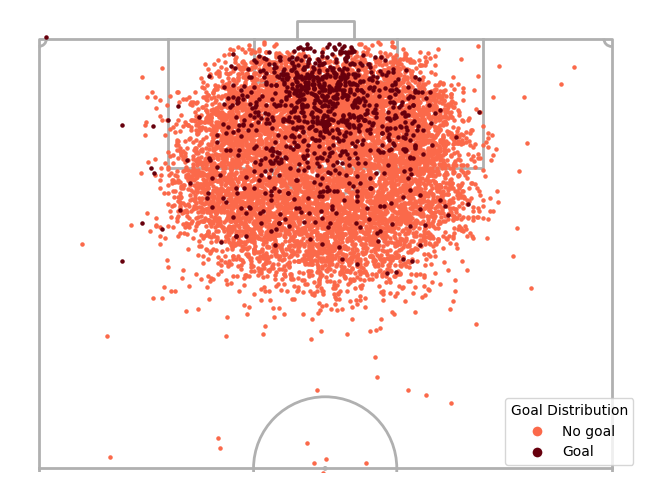

In [47]:
# The shot_distribution method can visualize shot outcomes (goals vs. non-goals) for the entire league,
# or for a specific team, match, or player by providing filtering arguments such as match_id, team_id, or player_id.
# Additionally, you can specify a sample size to limit the number of shots displayed.
print(f'Distribution of goals in Premier League for the {SEASON} season.')
PL_viz.shot_distribution(val='goal', t='goal')

#### G xG Performance (Players)

In [ ]:
print('G xG performance scatter for Premier League (Only players with more than 5 goals)')
PL_viz.gxg_scatter(min_goal=5)

print('G xG performance scatter for Ligue 1 (Only players with more than 5 goals)')
L1_viz.gxg_scatter(min_goal=5)

print('G xG performance scatter for Bundesliga (Only players with more than 5 goals)')
B1_viz.gxg_scatter(min_goal=5)

print('G xG performance scatter for Serie A (Only players with more than 5 goals)')
SA_viz.gxg_scatter(min_goal=5)

print('G xG performance scatter for La Liga (Only players with more than 5 goals)')
LL_viz.gxg_scatter(min_goal=5)

G xG performance scatter for Premier League (Only players with more than 5 goals)


In this scatter plot, each point represents a player's total goals (x-axis) versus their cumulative xG (y-axis).<br>
Players shown in green are overperformers, having scored more goals than expected, while players in red are underperformers, scoring fewer goals than their xG indicates.<br>
This color-coding offers an immediate visual insight into which players convert their chances at a higher or lower rate than predicted.

<u>Premier League</u><br>
Harry Kane topped the scoring chart with 25 goals, outperforming his 21.635 xG.<br>
Jamie Vardy followed closely with 24 goals (22.299 xG) in Leicester City’s miraculous title-winning season, and Sergio Agüero also scored 24 while significantly exceeding his 17.673 xG.<br>
Notably, the Premier League was the only league among the five where the top scorer did not surpass 30 goals, and there were no standout underperformers.<br>

<u>Ligue 1</u><br>
Zlatan Ibrahimović dominated with 36 goals, far above his xG of 22.698.<br>
Alexandre Lacazette ranked second with 21 goals (19.916 xG).<br>
Martin Braithwaite was the only noticeable underperformer, netting 11 goals against an xG of 15.141.<br>

<u>Bundesliga</u><br>
Robert Lewandowski led the way with 30 goals from a 24.519 xG, while Pierre-Emerick Aubameyang scored 25 goals but underperformed relative to his 27.783 xG.<br>
Timo Werner also underperformed, recording just 6 goals despite a 10.148 xG.<br>

<u>Serie A</u><br>
Like Ligue 1, Serie A featured a high-scoring leader: Gonzalo Higuaín notched 36 goals, well above his 25.026 xG.<br>
Paulo Dybala followed with 19 goals (14.793 xG), and Carlos Bacca had 18 (15.407 xG).<br>
Edin Džeko struggled with only 8 goals from a 13.468 xG, while Nikola Kalinić (12 goals vs. 15.112 xG) and Luca Toni (6 goals vs. 10.589 xG) also underperformed.<br>

<u>La Liga</u><br>
The top five scorers were all from Real Madrid or Barcelona, and each overperformed: Luis Suárez led with 40 goals (27.649 xG), followed by Cristiano Ronaldo’s 35 (31.968 xG) and Lionel Messi’s 26 (21.264 xG).<br>
No major underperformers stood out.<br>

<u>Overall</u><br>
These outcomes reflect the dominance of certain clubs—PSG, Bayern Munich, and Juventus—whose star forwards produced exceptional numbers, as well as the <i>'golden era'</i> in La Liga with Real Madrid and Barcelona.<br>
Luis Suárez posted the second-highest goals-minus-xG (12.351) behind Zlatan Ibrahimović (13.302).<br>
Meanwhile, the Premier League’s top scorers did not exceed 30 goals, yet Vardy’s remarkable campaign still surpassed all expectations.<br>

In [10]:
# The gxg_scatter method can compare goals and xG performance for either individual players or clubs.
# By specifying t='player' (default) or t='team', the method aggregates the data accordingly.
# For example, setting t='team' will group the shot data by clubs, allowing you to visualize overall club performance.
print(f'Goals vs. xG scatter plot for clubs in Premier League for the {SEASON} season.')
PL_viz.gxg_scatter(t='team')

Goals vs. xG scatter plot for clubs in Premier League for the 2015/2016 season.
